# Excess Mortality in EU Pre, During, and Post-COVID
Map visualization in Python using public datasets on local mortality levels across the EU pre-, during, and post-COVID.

## Environment and Data Preparation
Install additional dependencies and import libraries

In [0]:
%pip install geopandas folium mapclassify tqdm

Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
import os
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

Read the shapefile that contains EU country and subnational geometry data, identified by `NUTS_ID`

In [0]:
# Read NUTS shapefiles
SHAPE_FILE = os.path.join('..', 'data', 'NUTS_shapefile', 'NUTS_RG_03M_2021_3035.shp')
nuts_all = gpd.read_file(SHAPE_FILE)
nuts_all

,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID,geometry
0,BG,0,BG,Bulgaria,България,0.0,0,0,BG,"POLYGON ((5363358.686 2390534.464, 5368040.621..."
1,CH,0,CH,Schweiz/Suisse/Svizzera,Schweiz/Suisse/Svizzera,0.0,0,0,CH,"POLYGON ((4217105.160 2744025.879, 4218081.206..."
2,AL,0,AL,Shqipëria,Shqipëria,0.0,0,0,AL,"MULTIPOLYGON (((5129579.170 2204098.752, 51302..."
3,CZ,0,CZ,Česko,Česko,0.0,0,0,CZ,"POLYGON ((4635755.041 3113254.655, 4636696.907..."
4,BE,0,BE,Belgique/België,Belgique/België,0.0,0,0,BE,"MULTIPOLYGON (((3980658.913 3157888.224, 39782..."
...,...,...,...,...,...,...,...,...,...,...
2005,PL721,3,PL,Kielecki,Kielecki,4.0,2,3,PL721,"POLYGON ((5045154.002 3188348.042, 5050610.345..."
2006,PL722,3,PL,Sandomiersko-jędrzejowski,Sandomiersko-jędrzejowski,4.0,3,3,PL722,"POLYGON ((5144126.779 3173424.066, 5145744.365..."
2007,PL811,3,PL,Bialski,Bialski,4.0,3,3,PL811,"POLYGON ((5211233.634 3322625.572, 5214670.998..."
2008,UKN09,3,UK,Ards and North Down,Ards and North Down,4.0,1,1,UKN09,"MULTIPOLYGON (((3304949.255 3599623.166, 33047..."


Read the mortality data file that contains location identifiers `nuts_id`

In [0]:
MORTALITY_FILE = os.path.join('..', 'data', 'mortality_europe_19_23.csv')
mortality = pd.read_csv(MORTALITY_FILE)
mortality

,unit,cntr_code,nuts_id,levl_code,nuts_name,time_period,year,week,deaths_abs,deaths_rel,deaths_15_18
0,NR,AL,AL011,3,Dibër,2019_1,2019,1,22,1.294118,17.00
1,NR,AL,AL011,3,Dibër,2019_2,2019,2,20,0.824742,24.25
2,NR,AL,AL011,3,Dibër,2019_3,2019,3,21,0.823529,25.50
3,NR,AL,AL011,3,Dibër,2019_4,2019,4,22,0.946237,23.25
4,NR,AL,AL011,3,Dibër,2019_5,2019,5,22,1.073171,20.50
...,...,...,...,...,...,...,...,...,...,...,...
208662,NR,UK,UKN09,3,Ards and North Down,2020_47,2020,47,43,1.323077,32.50
208663,NR,UK,UKN09,3,Ards and North Down,2020_48,2020,48,26,0.793893,32.75
208664,NR,UK,UKN09,3,Ards and North Down,2020_49,2020,49,31,0.976378,31.75
208665,NR,UK,UKN09,3,Ards and North Down,2020_50,2020,50,26,0.702703,37.00


Minor mortality data cleaning: only keep 2020 onwards and scale relative deaths by 100x

In [0]:
mortality_2020on = mortality[mortality.year > 2019]
mortality_2020on['deaths_rel_scaled'] = (mortality_2020on['deaths_rel'] * 100).round()
mortality_2020on

<command-2230718909859640>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mortality_2020on['deaths_rel_scaled'] = (mortality_2020on['deaths_rel'] * 100).round()


,unit,cntr_code,nuts_id,levl_code,nuts_name,time_period,year,week,deaths_abs,deaths_rel,deaths_15_18,deaths_rel_scaled
52,NR,AL,AL011,3,Dibër,2020_1,2020,1,15,0.882353,17.00,88.0
53,NR,AL,AL011,3,Dibër,2020_2,2020,2,16,0.659794,24.25,66.0
54,NR,AL,AL011,3,Dibër,2020_3,2020,3,16,0.627451,25.50,63.0
55,NR,AL,AL011,3,Dibër,2020_4,2020,4,23,0.989247,23.25,99.0
56,NR,AL,AL011,3,Dibër,2020_5,2020,5,26,1.268293,20.50,127.0
...,...,...,...,...,...,...,...,...,...,...,...,...
208662,NR,UK,UKN09,3,Ards and North Down,2020_47,2020,47,43,1.323077,32.50,132.0
208663,NR,UK,UKN09,3,Ards and North Down,2020_48,2020,48,26,0.793893,32.75,79.0
208664,NR,UK,UKN09,3,Ards and North Down,2020_49,2020,49,31,0.976378,31.75,98.0
208665,NR,UK,UKN09,3,Ards and North Down,2020_50,2020,50,26,0.702703,37.00,70.0


In [0]:
# mortality_2020on.info()
assert mortality_2020on.nuts_id.isna().sum() == 0, "Expect no missing nuts_id, but found some"

In [0]:
# mortality_2020on.describe(include='all')
mortality_2020on.levl_code.describe()

Out[6]: count    157344.000000
mean          2.957132
std           0.287616
min           1.000000
25%           3.000000
50%           3.000000
75%           3.000000
max           3.000000
Name: levl_code, dtype: float64

In [0]:
nuts_all.keys()

Out[7]: Index(['NUTS_ID', 'LEVL_CODE', 'CNTR_CODE', 'NAME_LATN', 'NUTS_NAME',
       'MOUNT_TYPE', 'URBN_TYPE', 'COAST_TYPE', 'FID', 'geometry'],
      dtype='object')

In [0]:
# the geopandas df needs to be on the left for the resulting df to be a geo df
mortality_w_geo = pd.merge(nuts_all, mortality_2020on, how="right", left_on="NUTS_ID", right_on="nuts_id")
mortality_w_geo

,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,FID,geometry,...,nuts_id,levl_code,nuts_name,time_period,year,week,deaths_abs,deaths_rel,deaths_15_18,deaths_rel_scaled
0,AL011,3,AL,Dibër,Dibër,4.0,3,3,AL011,"POLYGON ((5198279.444 2144087.068, 5198325.603...",...,AL011,3,Dibër,2020_1,2020,1,15,0.882353,17.00,88.0
1,AL011,3,AL,Dibër,Dibër,4.0,3,3,AL011,"POLYGON ((5198279.444 2144087.068, 5198325.603...",...,AL011,3,Dibër,2020_2,2020,2,16,0.659794,24.25,66.0
2,AL011,3,AL,Dibër,Dibër,4.0,3,3,AL011,"POLYGON ((5198279.444 2144087.068, 5198325.603...",...,AL011,3,Dibër,2020_3,2020,3,16,0.627451,25.50,63.0
3,AL011,3,AL,Dibër,Dibër,4.0,3,3,AL011,"POLYGON ((5198279.444 2144087.068, 5198325.603...",...,AL011,3,Dibër,2020_4,2020,4,23,0.989247,23.25,99.0
4,AL011,3,AL,Dibër,Dibër,4.0,3,3,AL011,"POLYGON ((5198279.444 2144087.068, 5198325.603...",...,AL011,3,Dibër,2020_5,2020,5,26,1.268293,20.50,127.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157339,UKN09,3,UK,Ards and North Down,Ards and North Down,4.0,1,1,UKN09,"MULTIPOLYGON (((3304949.255 3599623.166, 33047...",...,UKN09,3,Ards and North Down,2020_47,2020,47,43,1.323077,32.50,132.0
157340,UKN09,3,UK,Ards and North Down,Ards and North Down,4.0,1,1,UKN09,"MULTIPOLYGON (((3304949.255 3599623.166, 33047...",...,UKN09,3,Ards and North Down,2020_48,2020,48,26,0.793893,32.75,79.0
157341,UKN09,3,UK,Ards and North Down,Ards and North Down,4.0,1,1,UKN09,"MULTIPOLYGON (((3304949.255 3599623.166, 33047...",...,UKN09,3,Ards and North Down,2020_49,2020,49,31,0.976378,31.75,98.0
157342,UKN09,3,UK,Ards and North Down,Ards and North Down,4.0,1,1,UKN09,"MULTIPOLYGON (((3304949.255 3599623.166, 33047...",...,UKN09,3,Ards and North Down,2020_50,2020,50,26,0.702703,37.00,70.0


## Static Map Visualization
Pick a random period to visualize excess mortality measured using relative deaths on a map. Start with a basic `plot` command, specifying a color map and displaying legend.

Out[9]: <AxesSubplot:>

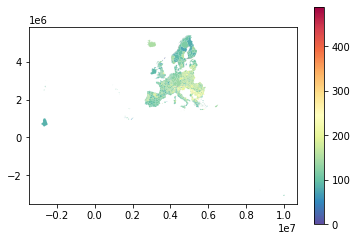

In [0]:
sample_period = '2020_50'
mortality_2020_w50 = mortality_w_geo[mortality_w_geo.time_period == sample_period]
mortality_2020_w50.plot(column='deaths_rel_scaled', cmap='Spectral_r', legend=True)

Zoom in and rid off the axis

Out[10]: <AxesSubplot:>

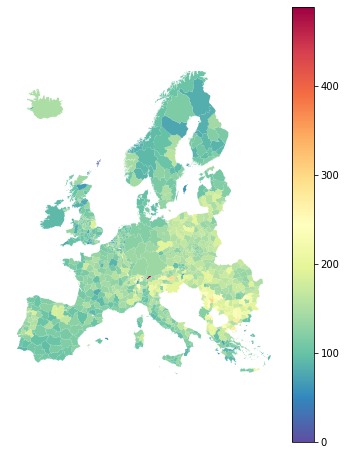

In [0]:
# specify bounding box
fig, ax = plt.subplots(figsize = (6, 8))
ax.set_xlim([2511158,  6011158])
ax.set_ylim([1381228,  5395358])

# remove axis
ax.set_axis_off()

mortality_2020_w50.plot(column='deaths_rel_scaled', cmap='Spectral_r', legend=True, ax=ax)

Surprising that during the height of the pandemic we don't see red. Maybe it's a value color coding issue. Quickly check the distribution of relative deaths.

Out[11]: (array([  4., 107., 545., 259.,  61.,   8.,   2.,   0.,   0.,   1.]),
 array([  0. ,  48.9,  97.8, 146.7, 195.6, 244.5, 293.4, 342.3, 391.2,
        440.1, 489. ]),
 <BarContainer object of 10 artists>)

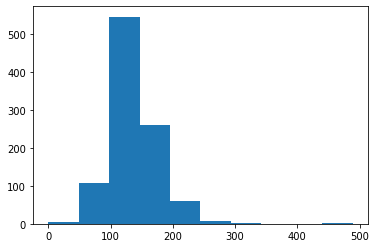

In [0]:
# check distribution of relative deaths
plt.hist(mortality_2020_w50.deaths_rel_scaled)

Cap the color coding at 200 max, which corresponds to 2x the baseline deaths. This covers a good % of data points and better shows variation and contrast (also because Robert says so). Then, overlay country boundaries for visual grouping of national trends.

Out[12]: <AxesSubplot:>

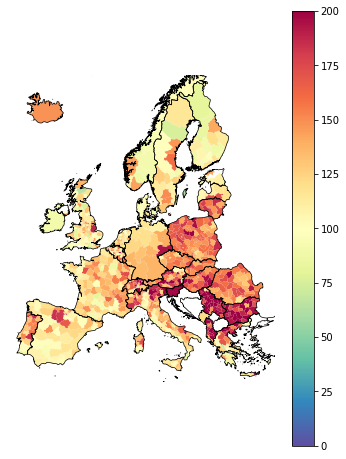

In [0]:
fig, ax = plt.subplots(figsize = (6, 8))
ax.set_xlim([2511158,  6011158])
ax.set_ylim([1381228,  5395358])
ax.set_axis_off()

# cap max value used for plotting to visualize variation & contrast
mortality_2020_w50.plot(column='deaths_rel_scaled', cmap='Spectral_r', legend=True, ax=ax, vmin=0, vmax=200)

# overlay country boundaries
countries = nuts_all[nuts_all["LEVL_CODE"] == 0]
countries.geometry.boundary.plot(ax=ax, color=None, edgecolor='k', linewidth=0.7)

Additional costmetic settings to make it look like Robert's map: reposition legend at the bottom, set a title and captions.

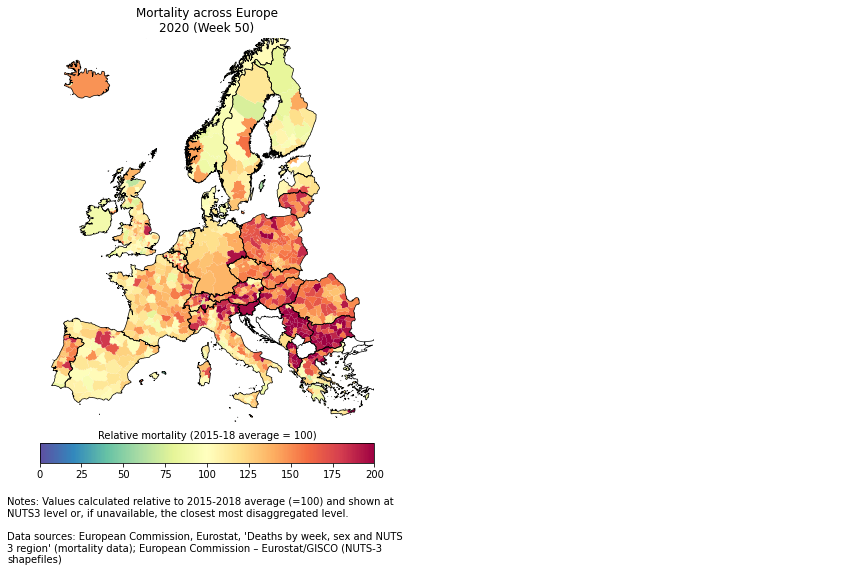

In [0]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize = (6, 9))
ax.set_xlim([2511158,  6011158])
ax.set_ylim([1381228,  5395358])
ax.set_axis_off()

# place legend at bottom
divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.3)
cax.annotate("Relative mortality (2015-18 average = 100)", 
             xy=(0.5, 1.25), 
             xycoords="axes fraction", 
             ha="center")
legend_kwds = {"orientation": "horizontal", }
mortality_2020_w50.plot(column='deaths_rel_scaled', cmap='Spectral_r', ax=ax, vmin=0, vmax=200, legend=True, legend_kwds=legend_kwds, cax=cax)

countries.geometry.boundary.plot(ax=ax, color=None, edgecolor='k', linewidth=0.7)

# set title
year, week = sample_period.split('_')
ax.set(title=f'Mortality across Europe\n{year} (Week {week})')

# set caption
caption = '''Notes: Values calculated relative to 2015-2018 average (=100) and shown at NUTS3 level or, if unavailable, the closest most disaggregated level.\n\nData sources: European Commission, Eurostat, 'Deaths by week, sex and NUTS 3 region' (mortality data); European Commission – Eurostat/GISCO (NUTS-3 shapefiles)'''
txt = fig.text(.05, .02, caption, ha='left', wrap=True)
txt._get_wrap_line_width = lambda : 400 # hack only necessary for displaying the graph in notebook

## Animated Map
Let's add the time dimension to the map visualization, starting with packaging the above visualization step as a function that takes the time_period as an argument.

In [0]:
caption = '''Notes: Values calculated relative to 2015-2018 average (=100) and shown at NUTS3 level or, if unavailable, the closest most disaggregated level.\n\nData sources: European Commission, Eurostat, 'Deaths by week, sex and NUTS 3 region' (mortality data); European Commission – Eurostat/GISCO (NUTS-3 shapefiles)'''

def plot_map(time_period):
    fig, ax = plt.subplots(figsize = (6, 9))
    fig.text(.05, .02, caption, wrap=True)

    ax.set_xlim([2511158,  6011158])
    ax.set_ylim([1381228,  5395358])
    ax.set_axis_off()

    year, week = time_period.split('_')
    ax.set(title=f'Mortality across Europe\n{year} (Week {week})')

    # plot relative mortality as colors
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.3)
    cax.annotate("Relative mortality (2015-18 average = 100)", 
                xy=(0.5, 1.25), 
                xycoords="axes fraction", 
                ha="center")
    mortality_w_geo[mortality_w_geo.time_period == time_period].plot(
        column='deaths_rel_scaled',
        cmap='Spectral_r',
        ax=ax, 
        vmin=0, 
        vmax=200, 
        legend=True, 
        legend_kwds={"orientation": "horizontal"}, 
        cax=cax
    )

    # plot country boundaries
    countries.geometry.boundary.plot(ax=ax, color=None, edgecolor='k', linewidth=0.7)
    
    return fig

Check that the function works

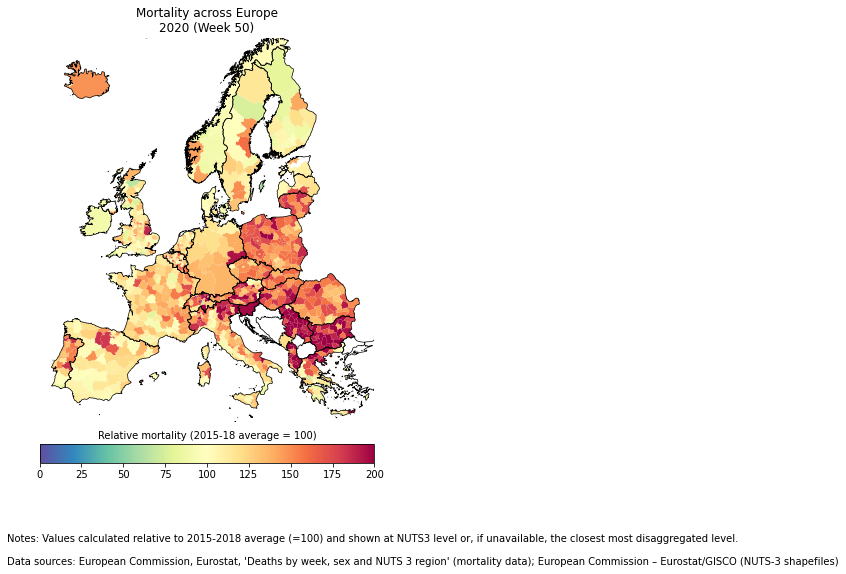

In [0]:
fig = plot_map('2020_50')
fig.show()

Create and save map viz for all time periods. Zero pad the week number in the output filename, e.g. 2023_3 becomes 2023_03. This way when the files are sorted by name they are sorted chronologically, otherwise 2023_21 will sort before 2023_3 due to alphanumerical order.

In [0]:
from tqdm import tqdm # for displaying progress
from glob import glob

# # clear all jpg files
# for f in tqdm(glob(os.path.join('output', '*.jpg'))):
#     os.remove(f)

unique_time_periods = mortality_w_geo.time_period.unique()
for time_period in tqdm(unique_time_periods):
    fig = plot_map(time_period)
    year, week = time_period.split('_')
    # zero pad week so simple filename sort is chronological
    filename = os.path.join('output', 'week', f'{year}_{week.zfill(2)}.jpg')
    fig.savefig(filename, dpi=150)
    plt.close(fig) 

100%|██████████| 187/187 [05:12<00:00,  1.67s/it]


Combine all the time periods' maps into a single gif

In [0]:
from PIL import Image

def combine_to_gif(input_filenames, output_filename, compress=True):
    images = []
    for filename in tqdm(input_filenames):
        img = Image.open(filename)
        if compress:
            img = img.resize((500, 750)) 
        images.append(img)

    images[0].save(
        output_filename,
        save_all=True, 
        append_images=images[1:], 
        duration=100, 
        loop=0 # 0 means loop forever
    )

gif_filename = os.path.join('output', "EU Excess Mortality 2020-2023.gif")
sorted_files = sorted(glob(os.path.join('output', 'week', '*.jpg')))
combine_to_gif(sorted_files, gif_filename)

100%|██████████| 187/187 [00:24<00:00,  7.50it/s]


Only aminate all weeks of 2020, with higher resolution image for each frame

In [0]:
gif_filename = os.path.join('output', "EU Excess Mortality 2020.gif")
sorted_files = sorted(glob(os.path.join('output', 'week', '2020_*.jpg')))
combine_to_gif(sorted_files, gif_filename, compress=False)

100%|██████████| 53/53 [00:04<00:00, 11.01it/s]


<img src="https://github.com/weilu/eu-mortality-viz/blob/main/python/output/EU%20Excess%20Mortality%202020.gif?raw=true" width=500/>

## Bonus: Interactive Map
Just because ;)

In [0]:
mortality_2020_w50.explore(
    column="deaths_rel_scaled",
    vmax=200,
    cmap="Spectral_r", 
    tooltip="deaths_rel_scaled",
    popup=True,  # show all values on click
)

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-1.12.4.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_2b19d06dd4e50cceb9247fe9d69ae5f0 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 
 <style>
 .foliumpopup {
 margin: auto;
 }
 .foliumpopup table{
 margin: auto;
 }
 .foliumpopup tr{
 text-align: left;
 }
 .foliumpopup th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_2b19d06dd4e50cceb9247fe9d69ae5f0" ></div>
 
</body>
<script>
 
 
 var map_2b19d06dd4e50cceb9247fe9d69ae5f0 = L.map(
 "map_2b19d06dd4e50cceb9247fe9d69ae5f0",
 {
 center: [24.89448377229155, -3.658337171829782],
 crs: L.CRS.EPSG3857,
 zoom: 10,
 zoomControl: true,
 preferCanvas: false,
 }
 );
 L.control.scale().addTo(map_2b19d06dd4e50cceb9247fe9d69ae5f0);

 

 
 
 var tile_layer_739397f5946ee4e25e46769622815dae = L.tileLayer(
 "https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png",
 {"attribution": "Data by \u0026copy; \u003ca target=\"_blank\" href=\"http://openstreetmap.org\"\u003eOpenStreetMap\u003c/a\u003e, under \u003ca target=\"_blank\" href=\"http://www.openstreetmap.org/copyright\"\u003eODbL\u003c/a\u003e.", "detectRetina": false, "maxNativeZoom": 18, "maxZoom": 18, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 ).addTo(map_2b19d06dd4e50cceb9247fe9d69ae5f0);
 
 
 map_2b19d06dd4e50cceb9247fe9d69ae5f0.fitBounds(
 [[-21.38695534273901, -63.15176444324211], [71.17592288732212, 55.835090099582544]],
 {}
 );
 
 
 function geo_json_d2b697fc3e59edf7f7e5b329f0e01d9f_styler(feature) {
 switch(feature.id) {
 case "49": case "10748": case "15236": case "24436": case "28282": case "96800": case "97874": case "122538": case "124034": case "124969": case "146152": case "155710": 
 return {"color": "#f47044", "fillColor": "#f47044", "fillOpacity": 0.5, "weight": 2};
 case "319": case "3153": case "7385": case "77762": case "83196": case "84628": case "97695": case "100213": case "126091": case "146338": case "148541": case "150559": 
 return {"color": "#fa9656", "fillColor": "#fa9656", "fillOpacity": 0.5, "weight": 2};
 case "589": 
 return {"color": "#bc2249", "fillColor": "#bc